## Setup de ambiente

In [1]:
!apt-get update
!apt-get upgrade

Lendo listas de pacotes... Pronto
E: Não foi possível abrir arquivo de trava /var/lib/apt/lists/lock - open (13: Permissão negada)
E: Impossível criar acesso exclusivo ao directório /var/lib/apt/lists/
W: Problema ao remover o link do ficheiro /var/cache/apt/pkgcache.bin - RemoveCaches (13: Permissão negada)
W: Problema ao remover o link do ficheiro /var/cache/apt/srcpkgcache.bin - RemoveCaches (13: Permissão negada)
E: Não foi possível abrir arquivo de trava /var/lib/dpkg/lock-frontend - open (13: Permissão negada)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?


In [2]:
!pip install opencv-contrib-python==4.5.4.58
!pip install ipyplot

     |████████████████████████████████| 66.5 MB 7.5 MB/s eta 0:00:014
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.5.3.56
    Uninstalling opencv-contrib-python-4.5.3.56:
      Successfully uninstalled opencv-contrib-python-4.5.3.56


In [3]:
import time
import cv2
import os
import ipyplot

In [4]:
# getting images and models
!git clone https://github.com/vcasadei/OpenCV_SR.git

Cloning into 'OpenCV_SR'...
remote: Enumerating objects: 132, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 132 (delta 1), reused 9 (delta 0), pack-reused 121
Receiving objects: 100% (132/132), 822.45 MiB | 6.53 MiB/s, done.
Resolving deltas: 100% (4/4), done.
Updating files: 100% (112/112), done.


In [5]:
!mv OpenCV_SR/models models/
!mv OpenCV_SR/imgs imgs/

## Seleção dos modelos

In [6]:
args_x2 = {"model_1": "models/EDSR_x2.pb", "model_2": "models/ESPCN_x2.pb", "model_3": "models/FSRCNN_x2.pb", "model_4": "models/LapSRN_x2.pb"}

In [7]:
args_x4 = {"model_1": "models/EDSR_x4.pb", "model_2": "models/ESPCN_x4.pb", "model_3": "models/FSRCNN_x4.pb", "model_4": "models/LapSRN_x4.pb"}

# x2 Upscale

In [8]:
args = args_x2

In [9]:
# MODEL 1
# extract the model name and model scale from the file path
modelName1 = args["model_1"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale1 = args["model_1"].split("_x")[-1]
modelScale1 = int(modelScale1[:modelScale1.find(".")])
print("[INFO] loading super resolution model: {}".format(args["model_1"]))
print("[INFO] model name: {}".format(modelName1))
print("[INFO] model scale: {}".format(modelScale1))

# MODEL 2
# extract the model name and model scale from the file path
modelName2 = args["model_2"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale2 = args["model_2"].split("_x")[-1]
modelScale2 = int(modelScale2[:modelScale2.find(".")])
print("[INFO] loading super resolution model: {}".format(args["model_2"]))
print("[INFO] model name: {}".format(modelName2))
print("[INFO] model scale: {}".format(modelScale2))

# MODEL 3
# extract the model name and model scale from the file path
modelName3 = args["model_3"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale3 = args["model_3"].split("_x")[-1]
modelScale3 = int(modelScale3[:modelScale3.find(".")])
print("[INFO] loading super resolution model: {}".format(args["model_3"]))
print("[INFO] model name: {}".format(modelName3))
print("[INFO] model scale: {}".format(modelScale3))

# MODEL 4
# extract the model name and model scale from the file path
modelName4 = args["model_4"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale4 = args["model_4"].split("_x")[-1]
modelScale4 = int(modelScale4[:modelScale4.find(".")])
print("[INFO] loading super resolution model: {}".format(args["model_4"]))
print("[INFO] model name: {}".format(modelName4))
print("[INFO] model scale: {}".format(modelScale4))

[INFO] loading super resolution model: models/EDSR_x2.pb
[INFO] model name: edsr
[INFO] model scale: 2
[INFO] loading super resolution model: models/ESPCN_x2.pb
[INFO] model name: espcn
[INFO] model scale: 2
[INFO] loading super resolution model: models/FSRCNN_x2.pb
[INFO] model name: fsrcnn
[INFO] model scale: 2
[INFO] loading super resolution model: models/LapSRN_x2.pb
[INFO] model name: lapsrn
[INFO] model scale: 2


## Instanciando modelos

In [10]:
#MODEL 1
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
sr1 = cv2.dnn_superres.DnnSuperResImpl_create()
sr1.readModel(args["model_1"])
sr1.setModel(modelName1, modelScale1)

#MODEL 2
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
sr2 = cv2.dnn_superres.DnnSuperResImpl_create()
sr2.readModel(args["model_2"])
sr2.setModel(modelName2, modelScale2)

#MODEL 3
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
sr3 = cv2.dnn_superres.DnnSuperResImpl_create()
sr3.readModel(args["model_3"])
sr3.setModel(modelName3, modelScale3)

#MODEL 4
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
sr4 = cv2.dnn_superres.DnnSuperResImpl_create()
sr4.readModel(args["model_4"])
sr4.setModel(modelName4, modelScale4)

In [11]:
# load the input image from disk and display its spatial dimensions
image = cv2.imread("imgs/lr/img1.png")
print("[INFO] w: {}, h: {}".format(image.shape[1], image.shape[0]))

[INFO] w: 248, h: 169


## Aplicando modelo

In [12]:
# use the super resolution model to upscale the image, timing how long it takes
start = time.time()
upscaled1 = sr1.upsample(image)
end = time.time()
print("[INFO][{}] super resolution took {:.6f} seconds".format(modelName1, end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled1.shape[1],upscaled1.shape[0]))

# use the super resolution model to upscale the image, timing how long it takes
start = time.time()
upscaled2 = sr2.upsample(image)
end = time.time()
print("[INFO][{}] super resolution took {:.6f} seconds".format(modelName2, end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled2.shape[1],upscaled2.shape[0]))

# use the super resolution model to upscale the image, timing how long it takes
start = time.time()
upscaled3 = sr3.upsample(image)
end = time.time()
print("[INFO][{}] super resolution took {:.6f} seconds".format(modelName3, end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled3.shape[1],upscaled3.shape[0]))

# use the super resolution model to upscale the image, timing how long it takes
start = time.time()
upscaled4 = sr4.upsample(image)
end = time.time()
print("[INFO][{}] super resolution took {:.6f} seconds".format(modelName4, end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled4.shape[1],upscaled4.shape[0]))

[INFO][edsr] super resolution took 7.965608 seconds
[INFO] w: 496, h: 338
[INFO][espcn] super resolution took 0.009679 seconds
[INFO] w: 496, h: 338
[INFO][fsrcnn] super resolution took 0.012751 seconds
[INFO] w: 496, h: 338
[INFO][lapsrn] super resolution took 0.101466 seconds
[INFO] w: 496, h: 338


In [13]:
# resize the image using standard bicubic interpolation
start = time.time()
bicubic = cv2.resize(image, (upscaled1.shape[1], upscaled1.shape[0]),	interpolation=cv2.INTER_CUBIC)
end = time.time()
print("[INFO] bicubic interpolation took {:.6f} seconds".format(end - start))

[INFO] bicubic interpolation took 0.000406 seconds


In [14]:
!mkdir imgs/generated
!mkdir imgs/generated/sr_2x
!mkdir imgs/generated/sr_3x
!mkdir imgs/generated/sr_4x
!mkdir imgs/generated/sr_8x

In [15]:
#Saving imgs
cv2.imwrite("imgs/generated/sr_" + str(modelScale1) + "x/bicubic.png" , bicubic)
cv2.imwrite("imgs/generated/sr_" + str(modelScale1) + "x/" + modelName1 + ".png", upscaled1)
cv2.imwrite("imgs/generated/sr_" + str(modelScale2) + "x/" + modelName2 + ".png", upscaled2)
cv2.imwrite("imgs/generated/sr_" + str(modelScale3) + "x/" + modelName3 + ".png", upscaled3)
cv2.imwrite("imgs/generated/sr_" + str(modelScale4) + "x/" + modelName4 + ".png", upscaled4)

True

In [16]:
mypath = "imgs/generated/sr_" + str(modelScale1) + "x"
files = []
for path in os.listdir(mypath):
    full_path = os.path.join(mypath, path)
    if os.path.isfile(full_path):
        files.append(full_path)
files = sorted(files)
labels = []

for file in files:
  modelName = file.split(os.path.sep)[-1]
  modelName = modelName[:modelName.find(".")].upper()
  labels.append(modelName)
files.insert(0, "imgs/sr_" + str(modelScale1) + "x/img1.png")
labels.insert(0, "Image High Resolution")


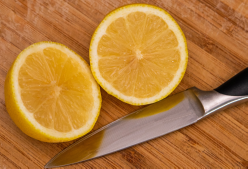


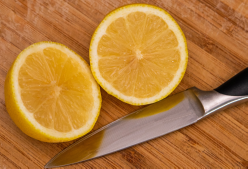


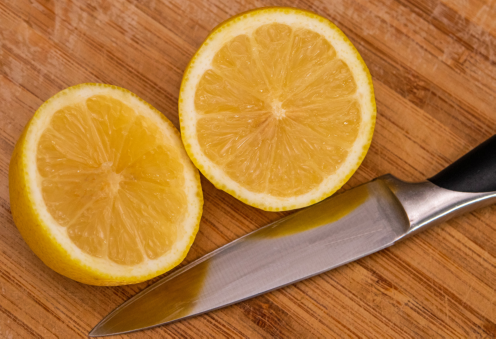
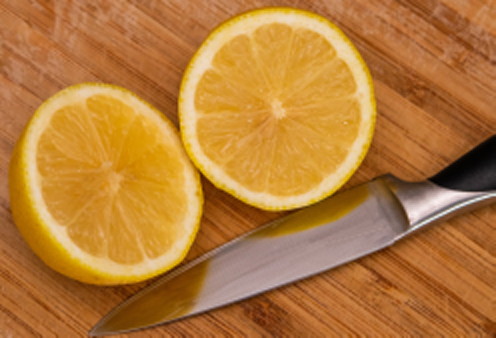
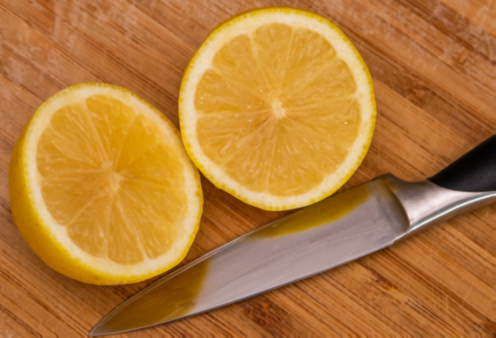
...
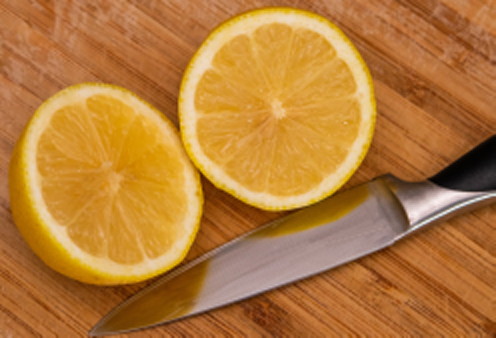
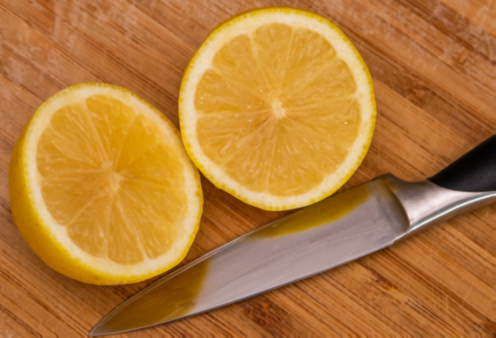
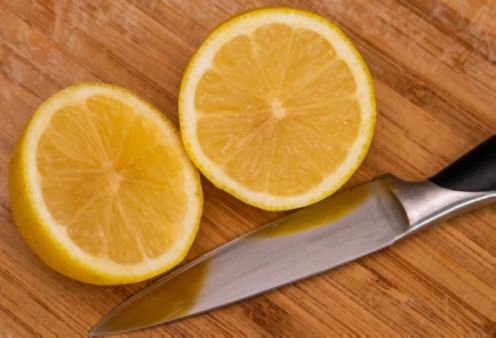
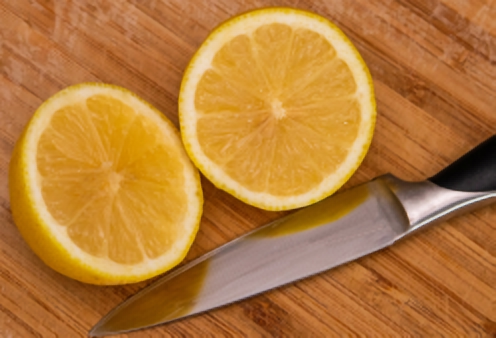
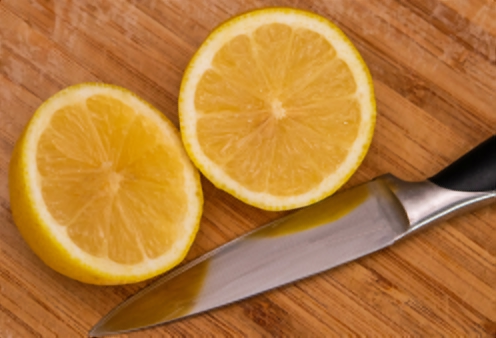

In [17]:
ipyplot.plot_images(["imgs/lr/img1.png"], ["Original Image"], force_b64 = True, img_width=image.shape[1])
ipyplot.plot_images(files, labels, force_b64 = True, img_width=upscaled1.shape[1])

# x4 Upscale

In [18]:
args = args_x4

In [19]:
# MODEL 1
# extract the model name and model scale from the file path
modelName1 = args["model_1"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale1 = args["model_1"].split("_x")[-1]
modelScale1 = int(modelScale1[:modelScale1.find(".")])
print("[INFO] loading super resolution model: {}".format(args["model_1"]))
print("[INFO] model name: {}".format(modelName1))
print("[INFO] model scale: {}".format(modelScale1))

# MODEL 2
# extract the model name and model scale from the file path
modelName2 = args["model_2"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale2 = args["model_2"].split("_x")[-1]
modelScale2 = int(modelScale2[:modelScale2.find(".")])
print("[INFO] loading super resolution model: {}".format(args["model_2"]))
print("[INFO] model name: {}".format(modelName2))
print("[INFO] model scale: {}".format(modelScale2))

# MODEL 3
# extract the model name and model scale from the file path
modelName3 = args["model_3"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale3 = args["model_3"].split("_x")[-1]
modelScale3 = int(modelScale3[:modelScale3.find(".")])
print("[INFO] loading super resolution model: {}".format(args["model_3"]))
print("[INFO] model name: {}".format(modelName3))
print("[INFO] model scale: {}".format(modelScale3))

# MODEL 4
# extract the model name and model scale from the file path
modelName4 = args["model_4"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale4 = args["model_4"].split("_x")[-1]
modelScale4 = int(modelScale4[:modelScale4.find(".")])
print("[INFO] loading super resolution model: {}".format(args["model_4"]))
print("[INFO] model name: {}".format(modelName4))
print("[INFO] model scale: {}".format(modelScale4))

[INFO] loading super resolution model: models/EDSR_x4.pb
[INFO] model name: edsr
[INFO] model scale: 4
[INFO] loading super resolution model: models/ESPCN_x4.pb
[INFO] model name: espcn
[INFO] model scale: 4
[INFO] loading super resolution model: models/FSRCNN_x4.pb
[INFO] model name: fsrcnn
[INFO] model scale: 4
[INFO] loading super resolution model: models/LapSRN_x4.pb
[INFO] model name: lapsrn
[INFO] model scale: 4


## Instanciando modelos

In [20]:
#MODEL 1
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
sr1 = cv2.dnn_superres.DnnSuperResImpl_create()
sr1.readModel(args["model_1"])
sr1.setModel(modelName1, modelScale1)

#MODEL 2
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
sr2 = cv2.dnn_superres.DnnSuperResImpl_create()
sr2.readModel(args["model_2"])
sr2.setModel(modelName2, modelScale2)

#MODEL 3
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
sr3 = cv2.dnn_superres.DnnSuperResImpl_create()
sr3.readModel(args["model_3"])
sr3.setModel(modelName3, modelScale3)

#MODEL 4
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
sr4 = cv2.dnn_superres.DnnSuperResImpl_create()
sr4.readModel(args["model_4"])
sr4.setModel(modelName4, modelScale4)

In [21]:
# load the input image from disk and display its spatial dimensions
image = cv2.imread("imgs/lr/img1.png")
print("[INFO] w: {}, h: {}".format(image.shape[1], image.shape[0]))

[INFO] w: 248, h: 169


## Aplicando modelo

In [22]:
# use the super resolution model to upscale the image, timing how long it takes
start = time.time()
upscaled1 = sr1.upsample(image)
end = time.time()
print("[INFO][{}] super resolution took {:.6f} seconds".format(modelName1, end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled1.shape[1],upscaled1.shape[0]))

# use the super resolution model to upscale the image, timing how long it takes
start = time.time()
upscaled2 = sr2.upsample(image)
end = time.time()
print("[INFO][{}] super resolution took {:.6f} seconds".format(modelName2, end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled2.shape[1],upscaled2.shape[0]))

# use the super resolution model to upscale the image, timing how long it takes
start = time.time()
upscaled3 = sr3.upsample(image)
end = time.time()
print("[INFO][{}] super resolution took {:.6f} seconds".format(modelName3, end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled3.shape[1],upscaled3.shape[0]))

# use the super resolution model to upscale the image, timing how long it takes
start = time.time()
upscaled4 = sr4.upsample(image)
end = time.time()
print("[INFO][{}] super resolution took {:.6f} seconds".format(modelName4, end - start))
# show the spatial dimensions of the super resolution image
print("[INFO] w: {}, h: {}".format(upscaled4.shape[1],upscaled4.shape[0]))

[INFO][edsr] super resolution took 7.803946 seconds
[INFO] w: 992, h: 676
[INFO][espcn] super resolution took 0.014174 seconds
[INFO] w: 992, h: 676
[INFO][fsrcnn] super resolution took 0.016341 seconds
[INFO] w: 992, h: 676
[INFO][lapsrn] super resolution took 0.617597 seconds
[INFO] w: 992, h: 676


In [23]:
# resize the image using standard bicubic interpolation
start = time.time()
bicubic = cv2.resize(image, (upscaled1.shape[1], upscaled1.shape[0]),	interpolation=cv2.INTER_CUBIC)
end = time.time()
print("[INFO] bicubic interpolation took {:.6f} seconds".format(end - start))

[INFO] bicubic interpolation took 0.000640 seconds


In [24]:
#Saving imgs
cv2.imwrite("imgs/generated/sr_" + str(modelScale1) + "x/bicubic.png" , bicubic)
cv2.imwrite("imgs/generated/sr_" + str(modelScale1) + "x/" + modelName1 + ".png", upscaled1)
cv2.imwrite("imgs/generated/sr_" + str(modelScale2) + "x/" + modelName2 + ".png", upscaled2)
cv2.imwrite("imgs/generated/sr_" + str(modelScale3) + "x/" + modelName3 + ".png", upscaled3)
cv2.imwrite("imgs/generated/sr_" + str(modelScale4) + "x/" + modelName4 + ".png", upscaled4)

True

In [25]:
mypath = "imgs/generated/sr_" + str(modelScale1) + "x"
files = []
for path in os.listdir(mypath):
    full_path = os.path.join(mypath, path)
    if os.path.isfile(full_path):
        files.append(full_path)
files = sorted(files)
labels = []

for file in files:
  modelName = file.split(os.path.sep)[-1]
  modelName = modelName[:modelName.find(".")].upper()
  labels.append(modelName)
files.insert(0, "imgs/sr_" + str(modelScale1) + "x/img1.png")
labels.insert(0, "Image High Resolution")


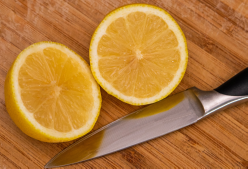


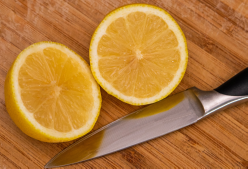


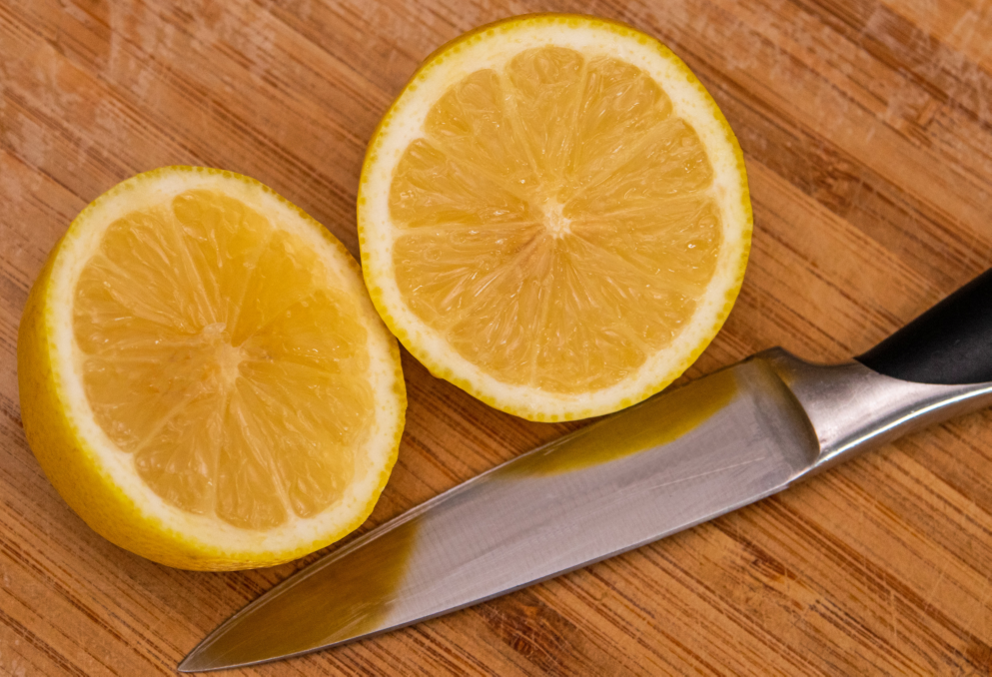
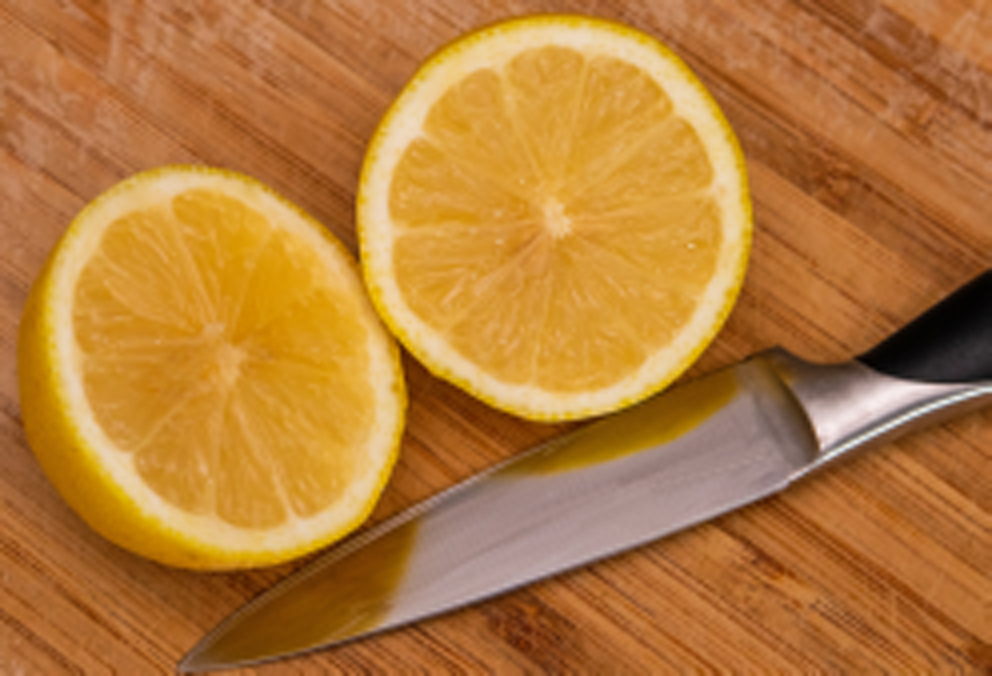
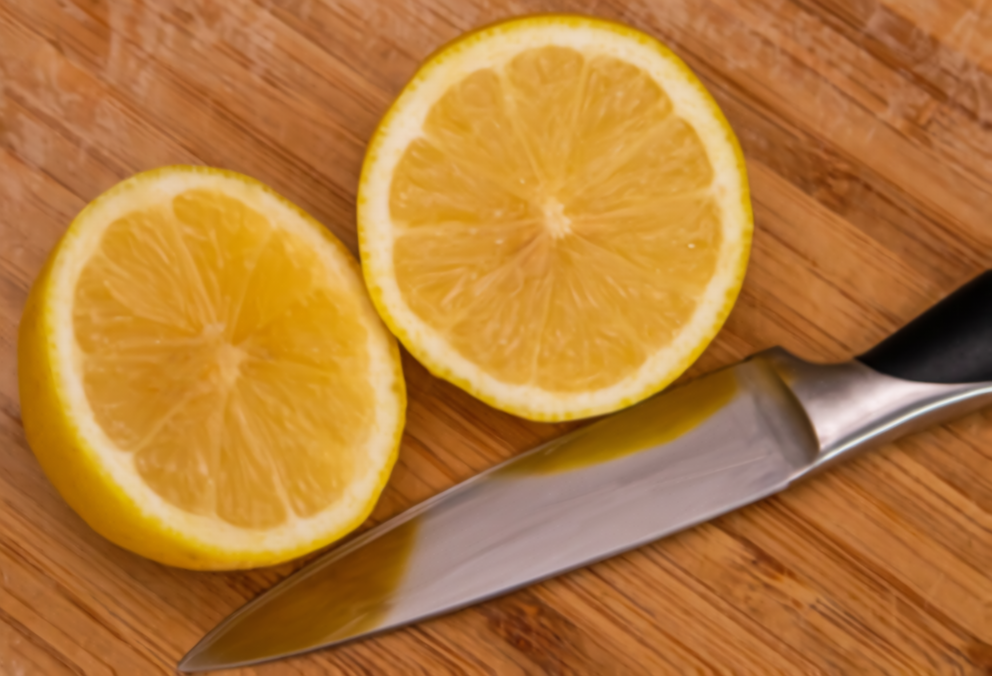
...
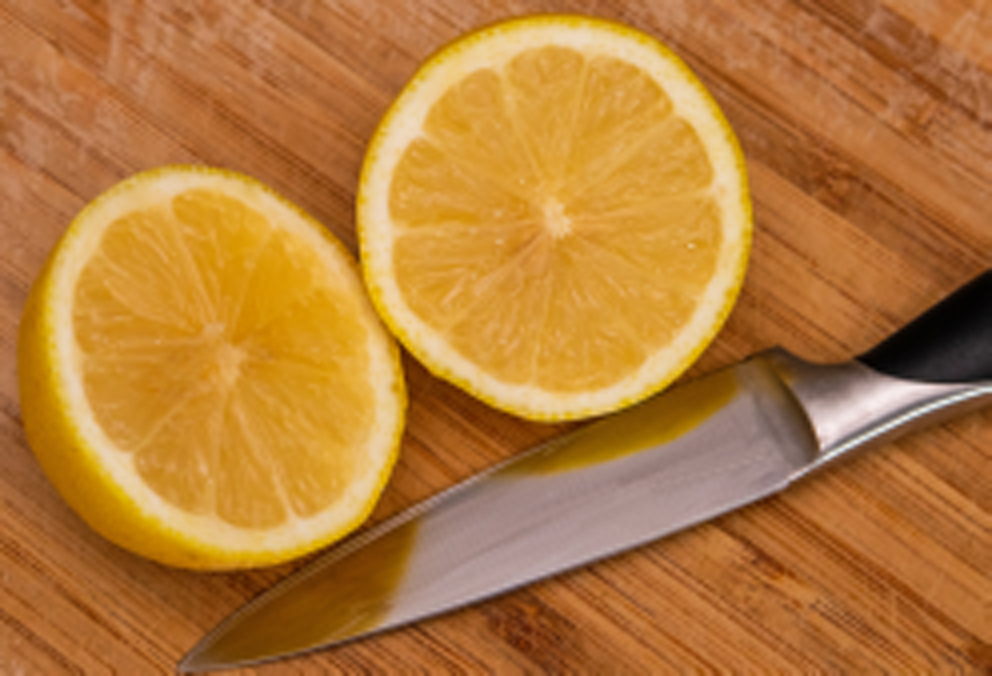
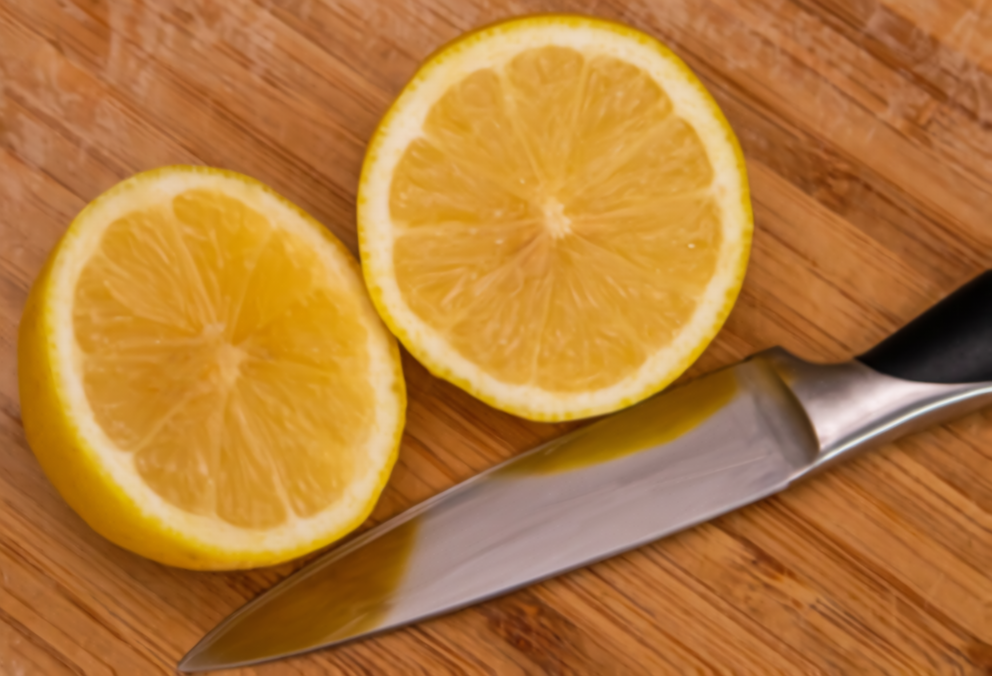
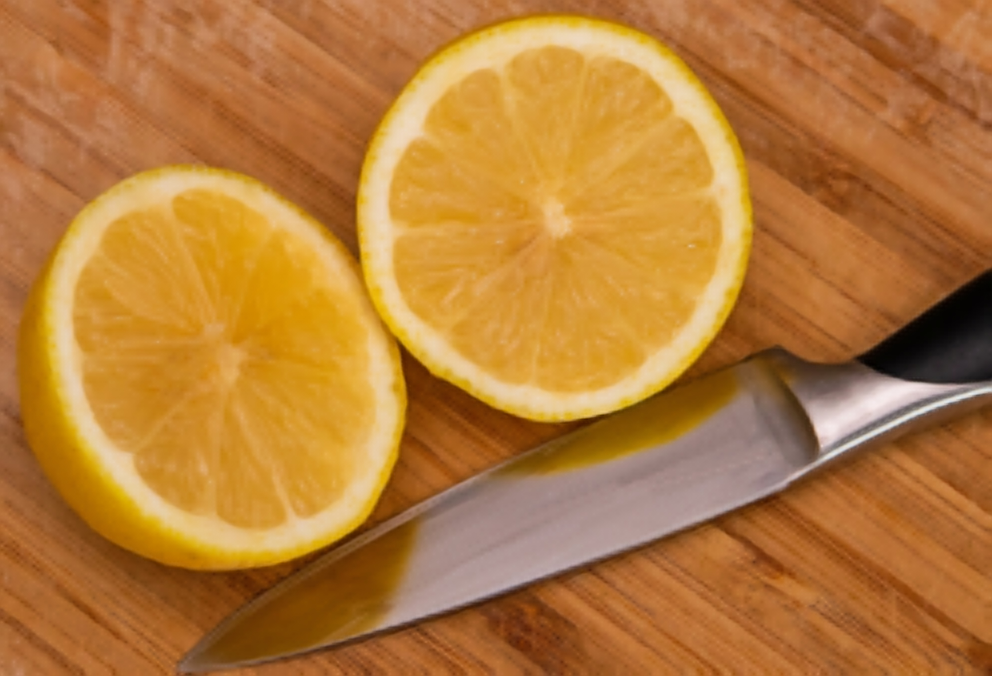
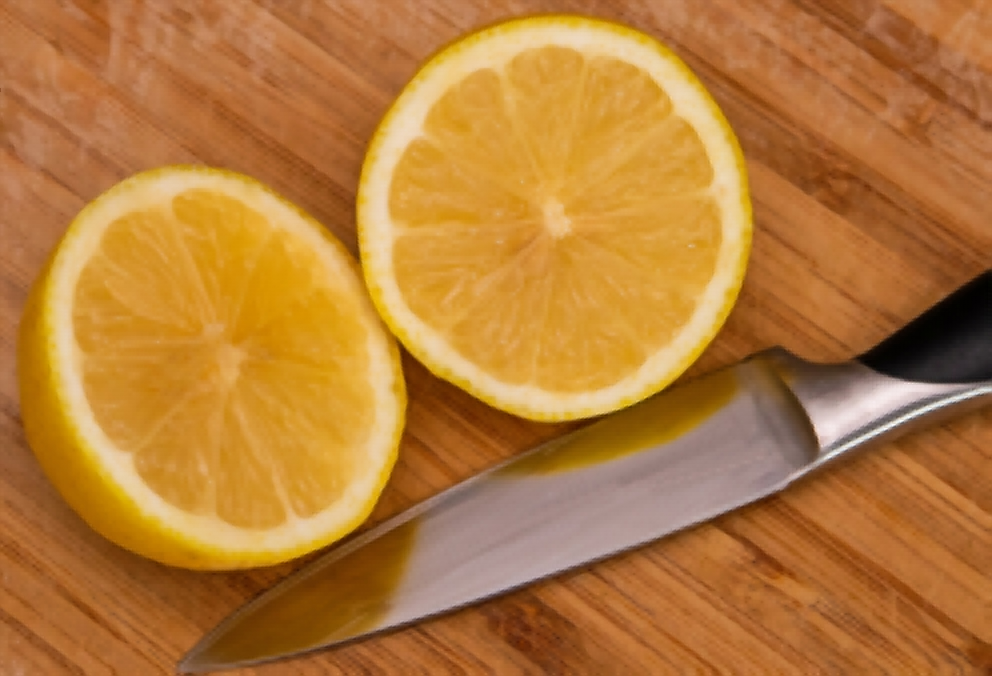
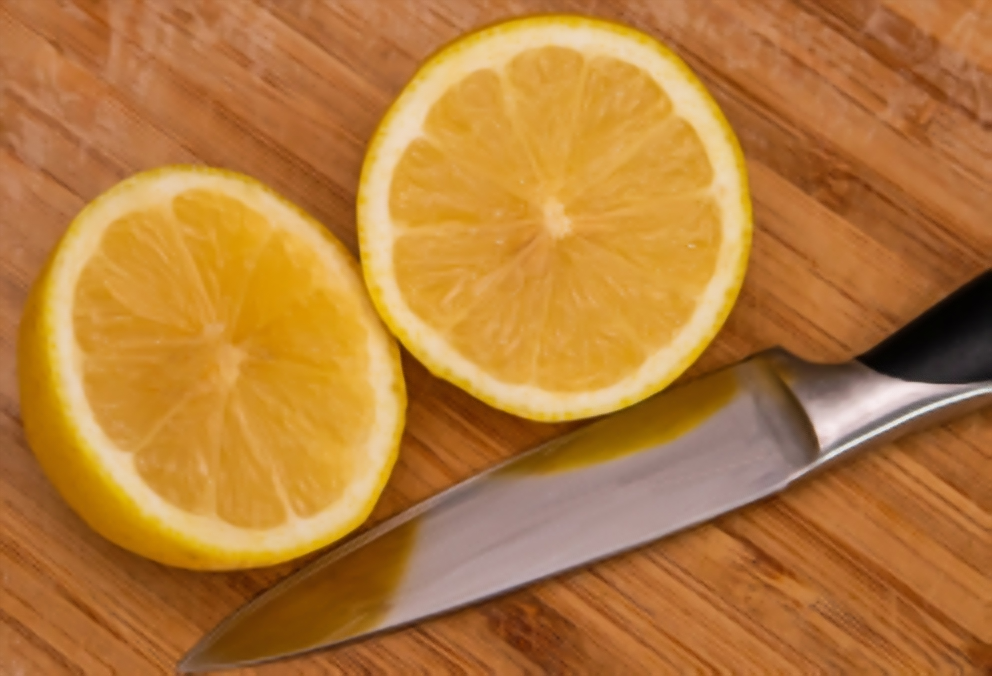

In [26]:
ipyplot.plot_images(["imgs/lr/img1.png"], ["Original Image"], force_b64 = True, img_width=image.shape[1])
ipyplot.plot_images(files, labels, force_b64 = True, img_width=upscaled1.shape[1])

# Video Example

## Setup de ambiente

In [27]:
# import the necessary packages
from imutils.video import VideoStream
import argparse
import imutils
import time
import cv2
import os

In [28]:
!mv OpenCV_SR/video video/

In [29]:
!mkdir -p video/generated/sr_2x
!mkdir -p video/generated/sr_4x

## x2 Video Upscale

In [30]:
args = args_x2

### Instanciando modelos

In [31]:
# extract the model name and model scale from the file path
modelName1 = args["model_1"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale1 = args["model_1"].split("_x")[-1]
modelScale1 = int(modelScale1[:modelScale1.find(".")])
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
print("[INFO] loading super resolution model: {}".format(args["model_1"]))
print("[INFO] model name: {}".format(modelName1))
print("[INFO] model scale: {}".format(modelScale1))

# extract the model name and model scale from the file path
modelName2 = args["model_2"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale2 = args["model_2"].split("_x")[-1]
modelScale2 = int(modelScale2[:modelScale2.find(".")])
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
print("[INFO] loading super resolution model: {}".format(args["model_2"]))
print("[INFO] model name: {}".format(modelName2))
print("[INFO] model scale: {}".format(modelScale2))

# extract the model name and model scale from the file path
modelName3 = args["model_3"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale3 = args["model_3"].split("_x")[-1]
modelScale3 = int(modelScale3[:modelScale3.find(".")])
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
print("[INFO] loading super resolution model: {}".format(args["model_3"]))
print("[INFO] model name: {}".format(modelName3))
print("[INFO] model scale: {}".format(modelScale3))

# extract the model name and model scale from the file path
modelName4 = args["model_4"].split(os.path.sep)[-1].split("_")[0].lower()
modelScale4 = args["model_4"].split("_x")[-1]
modelScale4 = int(modelScale4[:modelScale4.find(".")])
# initialize OpenCV's super resolution DNN object, load the super
# resolution model from disk, and set the model name and scale
print("[INFO] loading super resolution model: {}".format(args["model_4"]))
print("[INFO] model name: {}".format(modelName4))
print("[INFO] model scale: {}".format(modelScale4))

[INFO] loading super resolution model: models/EDSR_x2.pb
[INFO] model name: edsr
[INFO] model scale: 2
[INFO] loading super resolution model: models/ESPCN_x2.pb
[INFO] model name: espcn
[INFO] model scale: 2
[INFO] loading super resolution model: models/FSRCNN_x2.pb
[INFO] model name: fsrcnn
[INFO] model scale: 2
[INFO] loading super resolution model: models/LapSRN_x2.pb
[INFO] model name: lapsrn
[INFO] model scale: 2


In [32]:
sr1 = cv2.dnn_superres.DnnSuperResImpl_create()
sr1.readModel(args["model_1"])
sr1.setModel(modelName1, modelScale1)

sr2 = cv2.dnn_superres.DnnSuperResImpl_create()
sr2.readModel(args["model_2"])
sr2.setModel(modelName2, modelScale2)

sr3 = cv2.dnn_superres.DnnSuperResImpl_create()
sr3.readModel(args["model_3"])
sr3.setModel(modelName3, modelScale3)

sr4 = cv2.dnn_superres.DnnSuperResImpl_create()
sr4.readModel(args["model_4"])
sr4.setModel(modelName4, modelScale4)

In [33]:
video = cv2.VideoCapture("video/original/cartoon_144p.mp4")

### Aplicando Modelo

In [35]:
if video.isOpened(): 
    # get vcap property 
    original_width  = int(video.get(3))   # float `width`
    original_height = int(video.get(4))  # float `height`

fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out0 = cv2.VideoWriter("video/generated/sr_" + str(modelScale1) + "x/bicubic.avi",fourcc, 30, (original_width * modelScale4, original_height * modelScale4))
out1 = cv2.VideoWriter("video/generated/sr_" + str(modelScale1) + "x/upscaled1.avi",fourcc, 30, (original_width * modelScale4, original_height * modelScale4))
out2 = cv2.VideoWriter("video/generated/sr_" + str(modelScale1) + "x/upscaled2.avi",fourcc, 30, (original_width * modelScale4, original_height * modelScale4))
out3 = cv2.VideoWriter("video/generated/sr_" + str(modelScale1) + "x/upscaled3.avi",fourcc, 30, (original_width * modelScale4, original_height * modelScale4))
out4 = cv2.VideoWriter("video/generated/sr_" + str(modelScale1) + "x/upscaled4.avi",fourcc, 30, (original_width * modelScale4, original_height * modelScale4))

# loop over the frames from the video
success, frame = video.read()
while success:
    # upscale the frame using the super resolution model and then
    # bicubic interpolation (so we can visually compare the two)
    upscaled1 = sr1.upsample(frame)
    upscaled2 = sr2.upsample(frame)
    upscaled3 = sr3.upsample(frame)
    upscaled4 = sr4.upsample(frame)
    bicubic = cv2.resize(frame, (upscaled1.shape[1], upscaled1.shape[0]), interpolation=cv2.INTER_CUBIC)

    out0.write(bicubic)
    out1.write(upscaled1)
    out2.write(upscaled2)
    out3.write(upscaled3)
    out4.write(upscaled4)

    # grab the frame from the threaded video stream and resize it
    success, frame = video.read()

video.release()
out0.release()
out1.release()
out2.release()
out3.release()
out4.release()